## Residential power usage 3 years data - Timeseries
####  - Single family power usage data for 3 years

The data set contains hourly power usage of 2 storied house located in Houston, Texas, USA. The data set contains hourly power usage in kwh starting from 01-06-2016 to Current month of 2021. The dataset has marked notes for weekdays, weekends, COVID lockdown & vacation days in notes category column.

Power usage during day time is different from night time. The electrical devices that are inside the house are security DVR and POI cameras, 2 x refrigerators, 2 x 50 gallon water heater that are on during day time. At night several electrical bulbs, TV's, washing machine, dryer and AC run from evening 6pm to morning 8am starting from 01-06-2016 to the Current month of 2021. Thanks to wonderful weather at Houston, Texas we are blessed with almost 9 months of summer. Starting from Feb month to Nov month and winter is only for two months December and January for most of the years.


***Weather 2016 to 2021 daily ***
Units
Temperature in F deg
Dew Point in F deg
Humidity in %age
Wind in mph
Pressure in Hg
Precipitation in inch


### Objective

#### Build a model to forecast electricity consumption in Texas.
#### The data is classified in date/time and Value (kWh) in a day/month.

# **Table of Contents**
1. [Setup](#Section1)<br><br>
2. [Importing Data-set](#Section2)<br><br>
3. [Preprocessing Dataset](#Section3)<br><br>
4. [EDA on Processed Data](#Section4)<br><br>
5. [Decomposition](#Section5)<br><br>
6. [Stationarity Check](#Section6)<br/><br>
7. [Plotting ACF & PACF](#Section7)<br><br>
8. [Model Building](#Section8)<br><br>
9. [Future Prediction](#Section9)<br><br>
10. [Approach for model building -  Using facebook Prophet](#Section10)<br><br>
11. [Conclusions & Future Development](#Section11)<br><br>


<a id = Section1></a>
### **1. Set-up**

In [33]:
#pip install --upgrade --no-deps git+https://github.com/statsmodels/statsmodels.git

In [34]:
import pandas as pd  
import numpy as np

from datetime import datetime

import plotly.express as px

import warnings
warnings.filterwarnings('ignore')                   # To suppress all the warnings in the notebook.

import matplotlib.pylab as plt 
%matplotlib inline  
plt.style.use('Solarize_Light2')

from matplotlib.pylab import rcParams
rcParams['figure.figsize']  =  20, 10

from fbprophet.plot import plot_plotly
import plotly.offline as py

pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)

<a id = Section2></a>
### **2. Importing Data-set**

In [35]:
dataset  =  pd.read_csv('https://raw.githubusercontent.com/ukcalc/Python-Machine-Learning-Projects/main/Power-Consumption-Time-Series/power_usage_2016_to_2020.csv', usecols=['StartDate','Value (kWh)'], parse_dates=True,)
dataset.head()

,StartDate,Value (kWh)
0,2016-01-06 00:00:00,1.057
1,2016-01-06 01:00:00,1.171
2,2016-01-06 02:00:00,0.560
3,2016-01-06 03:00:00,0.828
4,2016-01-06 04:00:00,0.932


In [36]:
dataset.rename({'Value (kWh)' : 'Value'}, axis='columns', inplace=True)

In [37]:
dataset.head(200)

,StartDate,Value
0,2016-01-06 00:00:00,1.057
1,2016-01-06 01:00:00,1.171
2,2016-01-06 02:00:00,0.560
3,2016-01-06 03:00:00,0.828
4,2016-01-06 04:00:00,0.932
5,2016-01-06 05:00:00,0.333
6,2016-01-06 06:00:00,0.462
7,2016-01-06 07:00:00,0.493
8,2016-01-06 08:00:00,0.325
9,2016-01-06 09:00:00,0.294


<a id = Section3></a>
### **3. Preprocessing dataset**

In [38]:
dataset.isnull().sum()

StartDate    0
Value        0
dtype: int64

In [39]:
dataset.info();

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35952 entries, 0 to 35951
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   StartDate  35952 non-null  object 
 1   Value      35952 non-null  float64
dtypes: float64(1), object(1)
memory usage: 561.9+ KB


In [40]:
dataset['StartDate']  =  pd.to_datetime(dataset['StartDate'],infer_datetime_format = True)  #convert from string to datetime
indexedDataset  =  dataset.set_index(['StartDate'])

In [41]:
indexedDataset.isnull().sum()

Value    0
dtype: int64

In [42]:
indexedDataset.describe()

,Value
count,35952.000000
mean,0.891631
std,0.908133
min,0.064000
25%,0.323750
50%,0.501000
75%,1.072000
max,6.446000


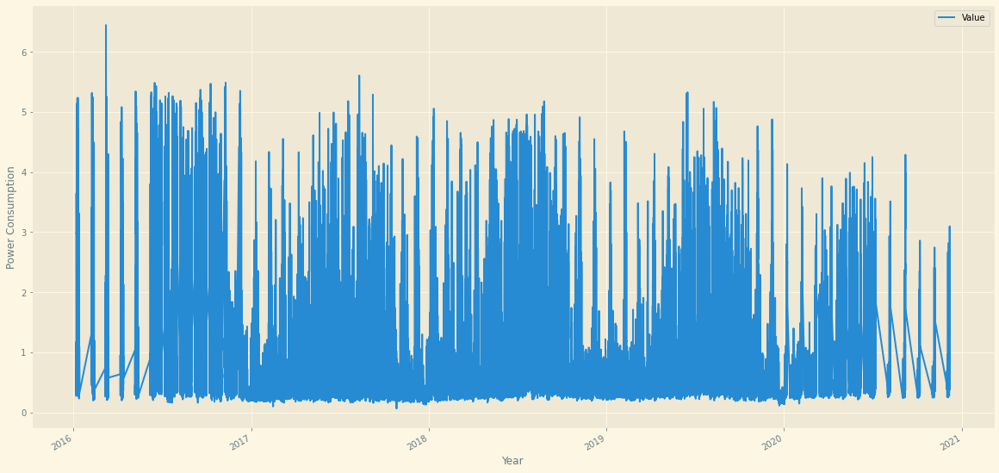

In [43]:
dataset.plot(x= 'StartDate', y = 'Value')  #use this line of code instead
plt.xlabel('Year')
plt.ylabel('Power Consumption');

In [44]:
fig = px.line(dataset, x='StartDate', y = 'Value', title='Electricity Consumption')
fig.update_xaxes(rangeslider_visible=True)
fig.show();

In [45]:
indexedDataset.loc['2016-01-13':'2016-01-31']

,Value
StartDate,


In [46]:
indexedDataset.isnull().sum()

Value    0
dtype: int64

In [47]:
indexedDataset_na = indexedDataset.copy()
indexedDataset_na = indexedDataset.dropna()

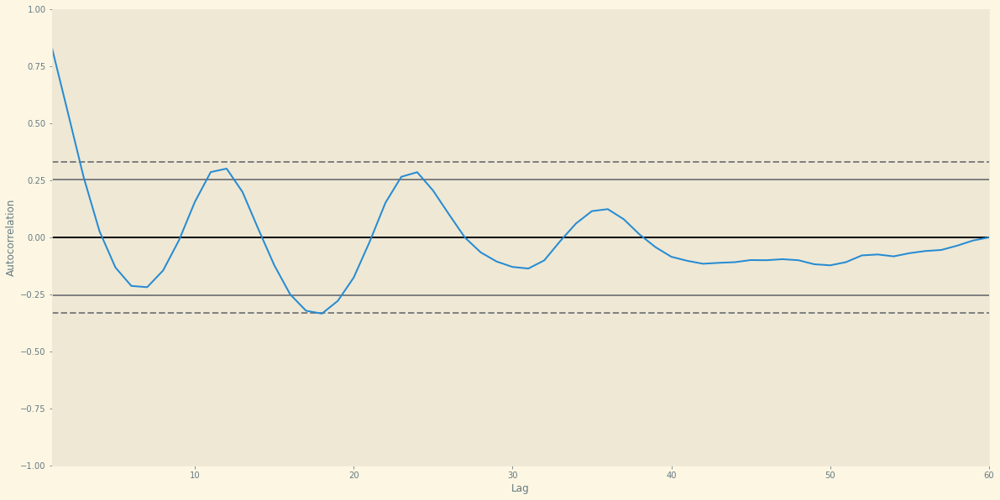

In [48]:
pd.plotting.autocorrelation_plot(indexedDataset_na['2016':'2020']['Value'].resample("1M").mean());

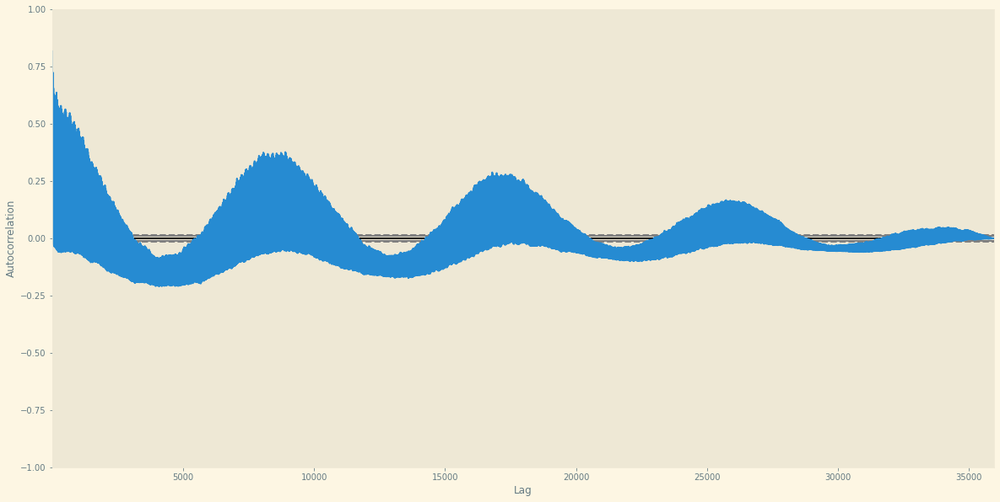

In [49]:
pd.plotting.autocorrelation_plot(indexedDataset_na['2016':'2020']['Value']);

In [50]:
indexedDataset_day = indexedDataset.resample('D').mean()

In [51]:
indexedDataset_day.isnull().sum()

Value    299
dtype: int64

In [52]:
indexedDataset_day['Value'] = indexedDataset_day['Value'].fillna(method='ffill')

In [53]:
indexedDataset_day.isnull().sum()

Value    0
dtype: int64

<a id = Section4></a>
### **4. EDA on Processed Data**

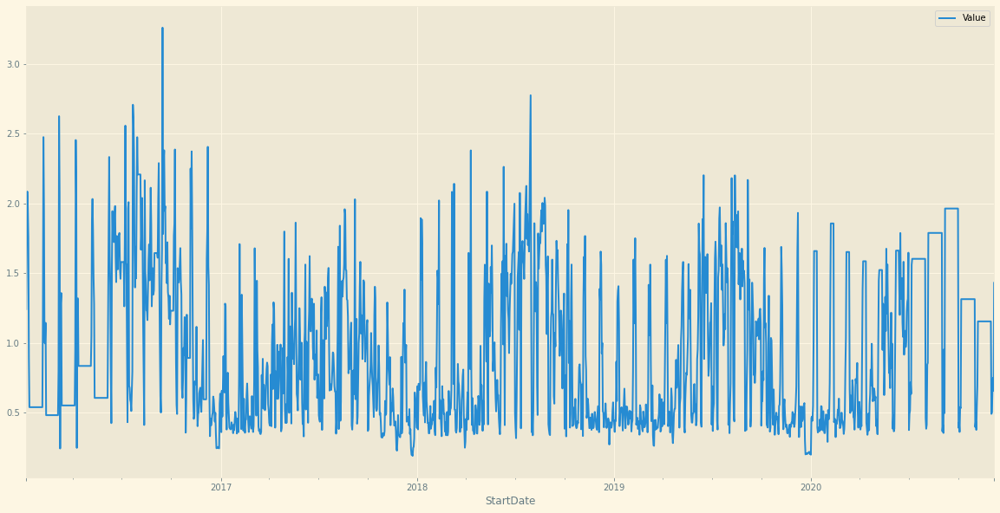

In [54]:
indexedDataset_day.plot();

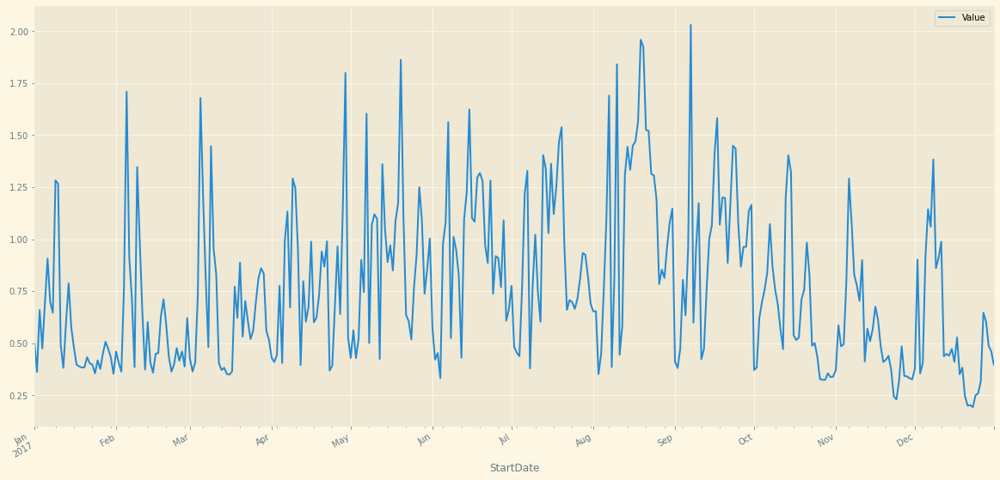

In [55]:
indexedDataset_2017 = indexedDataset_day['2017']
indexedDataset_2017.plot(subplots=True);

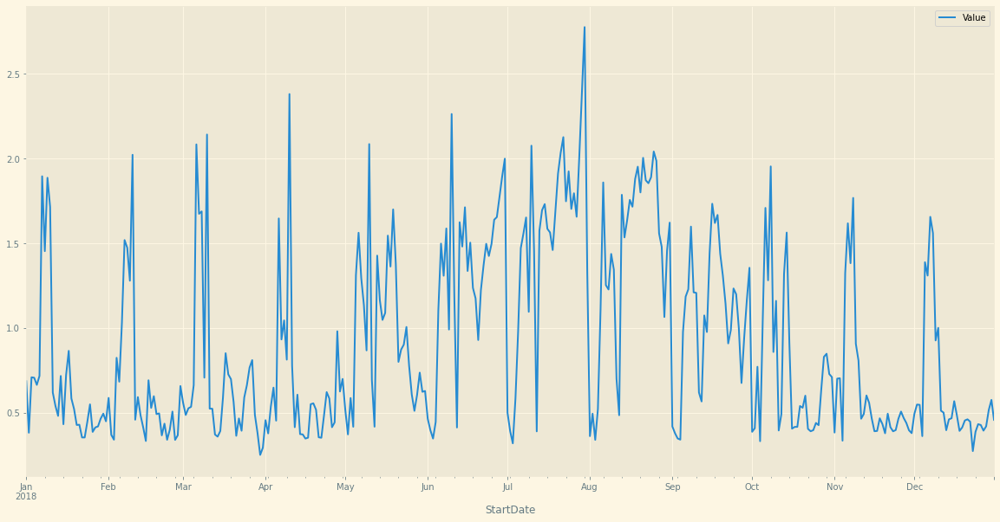

In [56]:
indexedDataset_2018 = indexedDataset_day['2018']
indexedDataset_2018.plot();

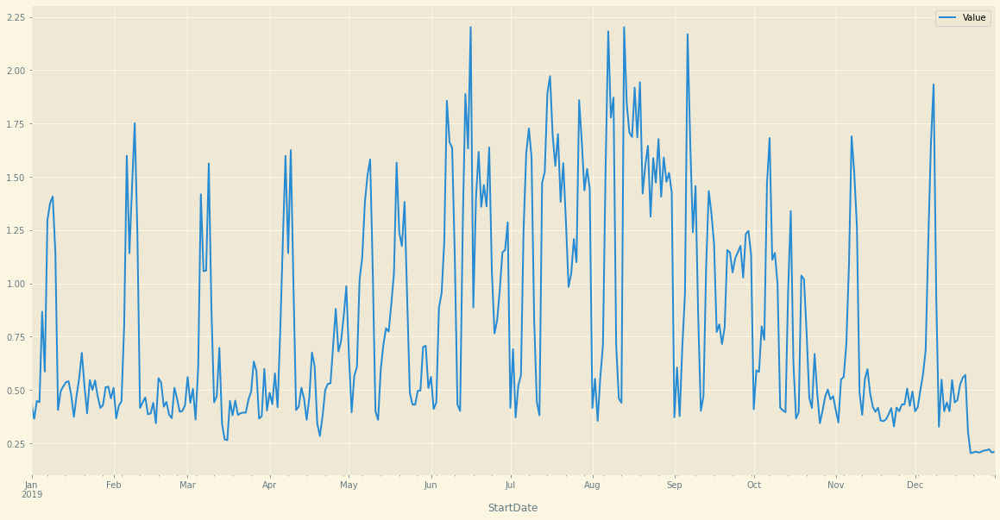

In [57]:
indexedDataset_2019 = indexedDataset_day['2019']
indexedDataset_2019.plot();

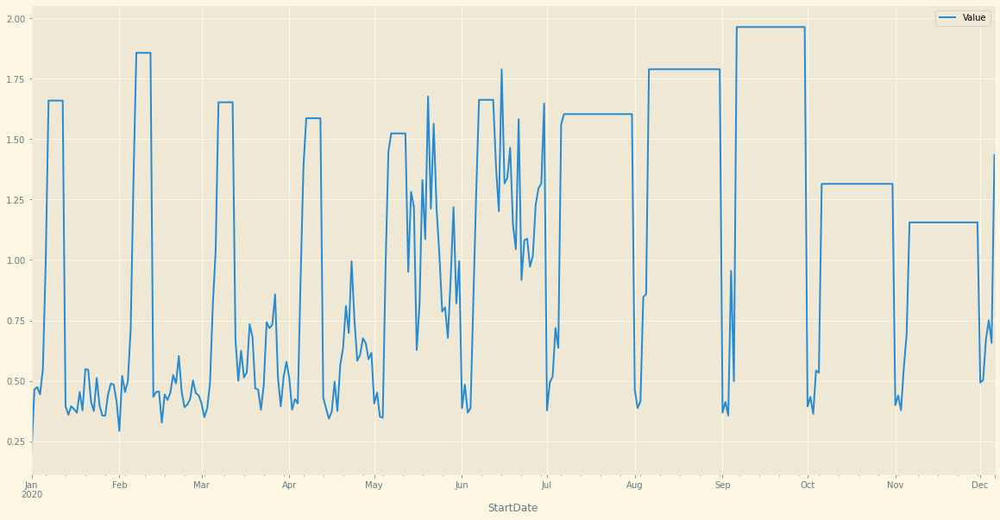

In [58]:
indexedDataset_2020 = indexedDataset_day['2020']
indexedDataset_2020.plot();

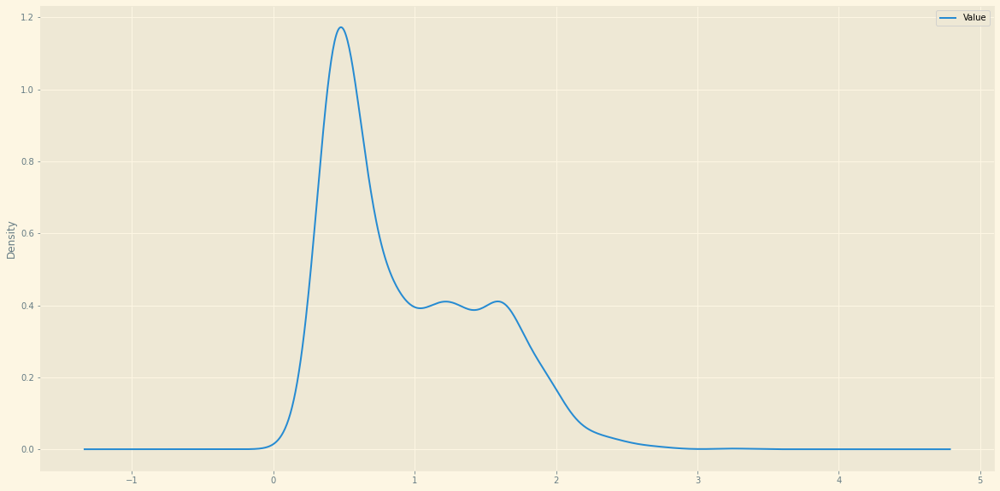

In [59]:
indexedDataset_day.plot(kind='density');

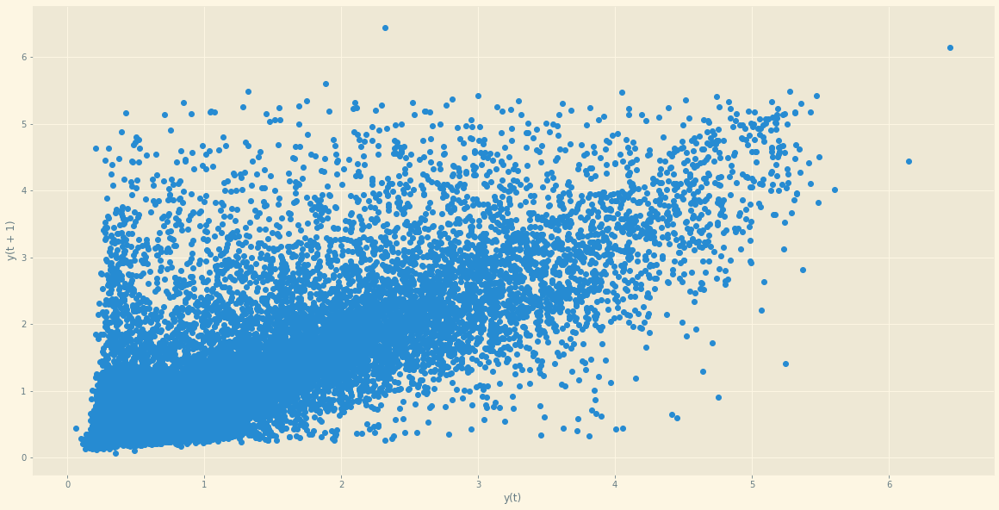

In [60]:
pd.plotting.lag_plot(indexedDataset_na['Value'],lag=1);

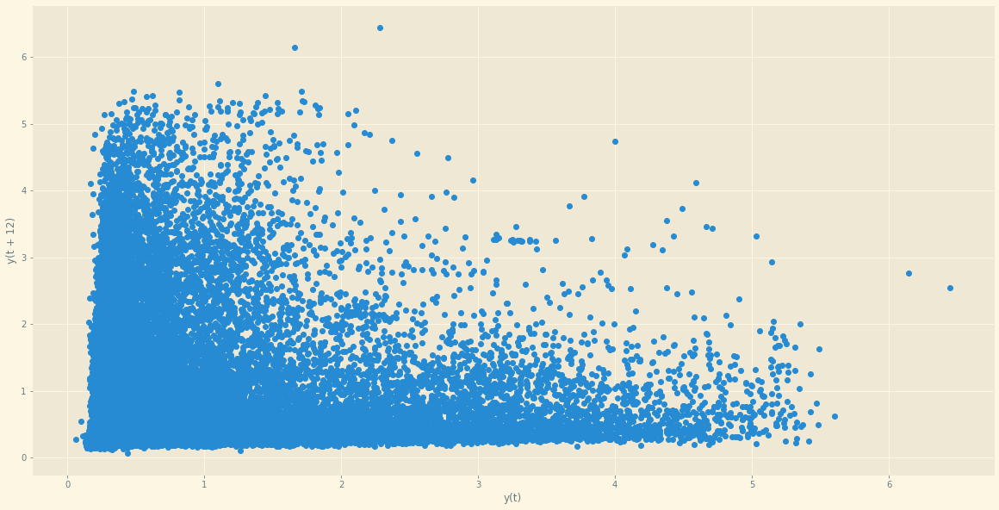

In [61]:
pd.plotting.lag_plot(indexedDataset_na['Value'],lag=12);

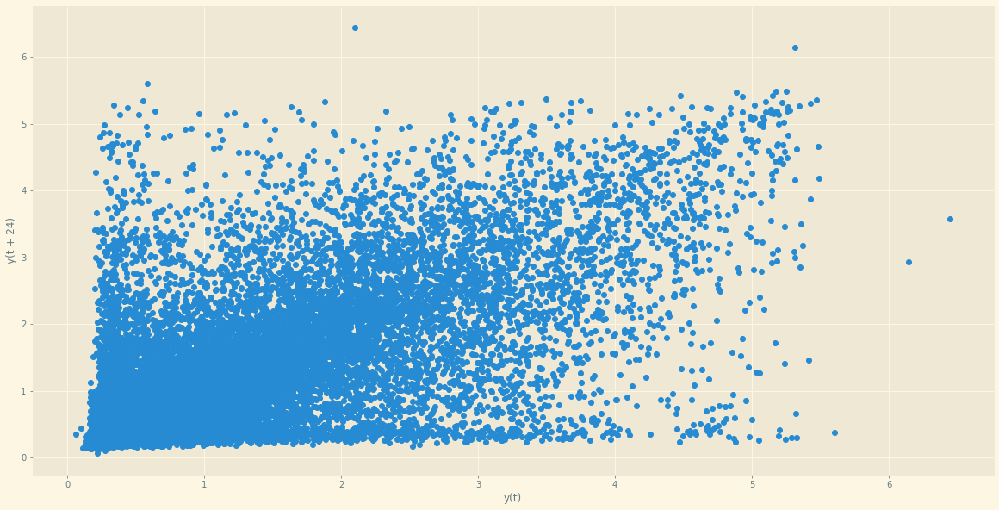

In [62]:
pd.plotting.lag_plot(indexedDataset_na['Value'],lag=24);

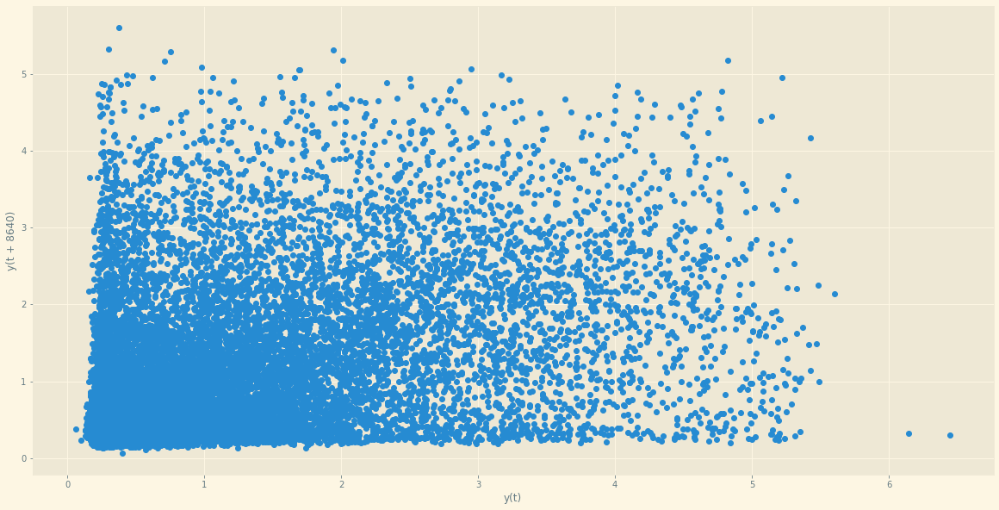

In [63]:
pd.plotting.lag_plot(indexedDataset_na['Value'],lag=8640);

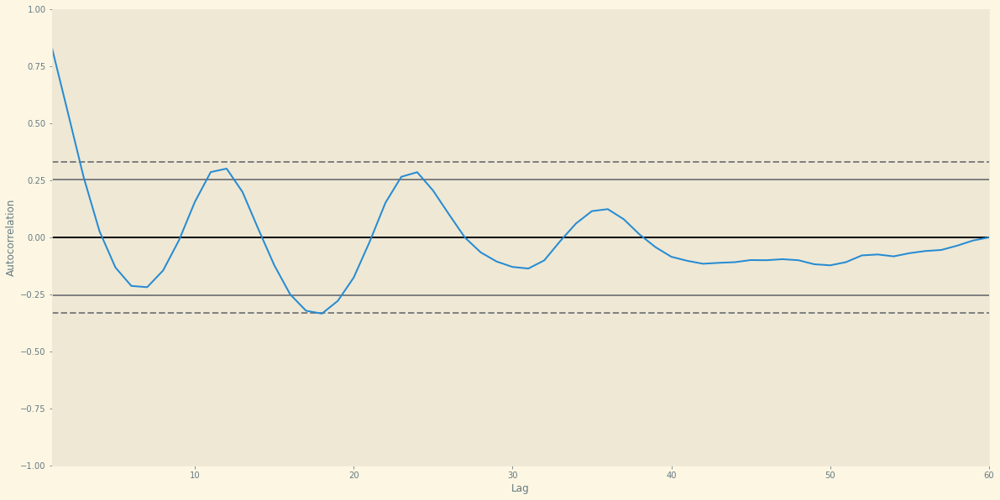

In [64]:
pd.plotting.autocorrelation_plot(indexedDataset['2016':'2020']['Value'].resample("1M").mean());

<a id = Section5></a>
### **5. Decomposition**

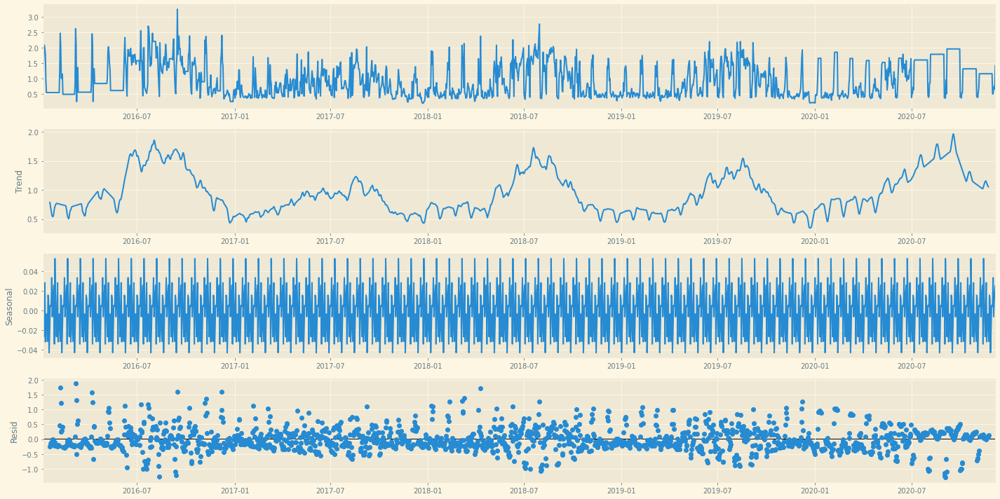

In [65]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize']  =  20, 10

from statsmodels.tsa.seasonal import seasonal_decompose
decomposed_dataset  =  seasonal_decompose(indexedDataset_day, model='additive', period = 24)          
decomposed_dataset.plot();
plt.show()

In [66]:
print(indexedDataset_day)

               Value
StartDate           
2016-01-06  1.237125
2016-01-07  1.799042
2016-01-08  2.085708
2016-01-09  1.973458
2016-01-10  1.758458
...              ...
2020-12-02  0.503625
2020-12-03  0.672083
2020-12-04  0.750458
2020-12-05  0.657375
2020-12-06  1.437667

[1797 rows x 1 columns]


In [67]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(indexedDataset_day, model='additive', period=24)
print(result.trend)
print(result.seasonal)
print(result.resid)
print(result.observed)

StartDate
2016-01-06   NaN
2016-01-07   NaN
2016-01-08   NaN
2016-01-09   NaN
2016-01-10   NaN
              ..
2020-12-02   NaN
2020-12-03   NaN
2020-12-04   NaN
2020-12-05   NaN
2020-12-06   NaN
Freq: D, Name: trend, Length: 1797, dtype: float64
StartDate
2016-01-06   -0.006912
2016-01-07   -0.026435
2016-01-08   -0.002165
2016-01-09    0.028186
2016-01-10   -0.031627
                ...   
2020-12-02    0.033327
2020-12-03   -0.006214
2020-12-04    0.009199
2020-12-05    0.017332
2020-12-06    0.025817
Freq: D, Name: seasonal, Length: 1797, dtype: float64
StartDate
2016-01-06   NaN
2016-01-07   NaN
2016-01-08   NaN
2016-01-09   NaN
2016-01-10   NaN
              ..
2020-12-02   NaN
2020-12-03   NaN
2020-12-04   NaN
2020-12-05   NaN
2020-12-06   NaN
Freq: D, Name: resid, Length: 1797, dtype: float64
StartDate
2016-01-06    1.237125
2016-01-07    1.799042
2016-01-08    2.085708
2016-01-09    1.973458
2016-01-10    1.758458
                ...   
2020-12-02    0.503625
2020-12-03    0.

<a id = Section6></a>
### **6. Stationarity Check**

In [68]:
# Determine rolling statistics
def rolling_means(time_series):
    rolmean  =  time_series.rolling(window = 24).mean()    #window size 12 denotes 12 months, giving rolling mean at yearly level
    rolstd  =  time_series.rolling(window = 24).std()

    #Plot rolling statistics

    rcParams['figure.figsize']  =  20, 10 

    orig  =  plt.plot(time_series, color = 'blue', label = 'Original')
    mean  =  plt.plot(rolmean, color = 'red', label = 'Rolling Mean')
    std  =  plt.plot(rolstd, color = 'black', label = 'Rolling Std')
    plt.legend(loc = 'best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block = False)

In [69]:
#Perform Augmented Dickey–Fuller test:
def adf_test(time_series):
    from statsmodels.tsa.stattools import adfuller
    dftest  =  adfuller(time_series['Value'], autolag = 'AIC')

    dfoutput  =  pd.Series(dftest[0:4], index = ['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key]  =  value
    
    print('Results of Dickey Fuller Test:')    
    print(dfoutput)

In [70]:
def test_stationarity(time_series):
    rolling_means(time_series)
    adf_test(time_series)

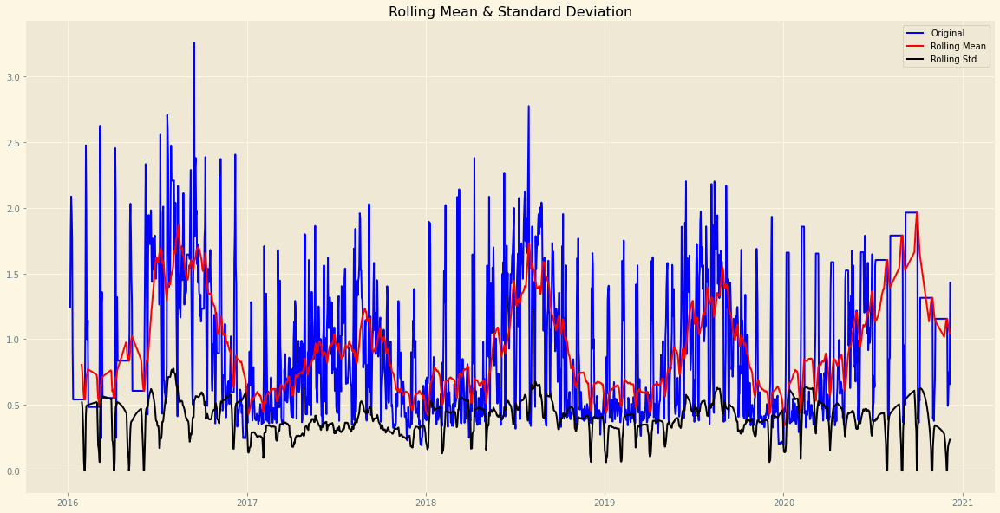

Results of Dickey Fuller Test:
Test Statistic                   -4.096144
p-value                           0.000983
#Lags Used                       25.000000
Number of Observations Used    1771.000000
Critical Value (1%)              -3.434048
Critical Value (5%)              -2.863173
Critical Value (10%)             -2.567640
dtype: float64


In [71]:
test_stationarity(indexedDataset_day)

<a id = Section7></a>
### **7. Plotting ACF & PACF**

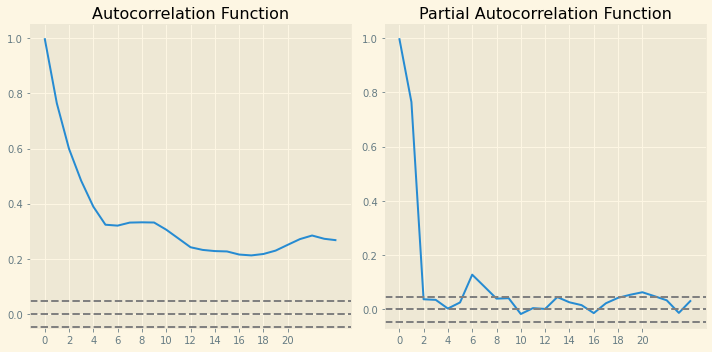

In [72]:
#ACF & PACF plots

from statsmodels.tsa.stattools import acf, pacf

lag_acf  =  acf(indexedDataset_day, nlags = 24)
lag_pacf  =  pacf(indexedDataset_day, nlags = 24, method = 'ols')
rcParams['figure.figsize']  =  10, 5
#Plot ACF:
plt.subplot(121)
plt.plot(lag_acf)
plt.axhline(y = 0, linestyle = '--', color = 'gray')
plt.axhline(y = -1.96/np.sqrt(len(indexedDataset_day)), linestyle = '--', color = 'gray')
plt.axhline(y = 1.96/np.sqrt(len(indexedDataset_day)), linestyle = '--', color = 'gray')
plt.xticks(np.arange(0,22,2))
plt.title('Autocorrelation Function')            

#Plot PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y = 0, linestyle = '--', color = 'gray')
plt.axhline(y = -1.96/np.sqrt(len(indexedDataset_day)), linestyle = '--', color = 'gray')
plt.axhline(y = 1.96/np.sqrt(len(indexedDataset_day)), linestyle = '--', color = 'gray')
plt.xticks(np.arange(0,22,2))
plt.title('Partial Autocorrelation Function')
            
plt.tight_layout()            

<a id = Section8></a>
### **8. Model Building**

In [73]:
train, test = indexedDataset_day[1:len(indexedDataset_day)-365], indexedDataset_day[len(indexedDataset_day)-365:]
train.head()
print(train.shape)
print(test.shape)
len(indexedDataset_day)

(1431, 1)
(365, 1)


1797

### 8.1.1. AR Model 

In [74]:
from statsmodels.tsa.ar_model import AR
model = AR(train)
model_fit = model.fit()
print('Lag: %s' % model_fit.k_ar)
print('Coefficients: %s' % model_fit.params)
print(model_fit.fittedvalues)
print(model)

Lag: 23
Coefficients: const        0.105972
L1.Value     0.651527
L2.Value    -0.003118
L3.Value     0.048938
L4.Value    -0.016497
L5.Value    -0.048988
L6.Value     0.051888
L7.Value     0.068864
L8.Value     0.016953
L9.Value     0.057234
L10.Value   -0.004469
L11.Value   -0.009770
L12.Value   -0.053624
L13.Value    0.014905
L14.Value    0.009597
L15.Value    0.016875
L16.Value   -0.027692
L17.Value   -0.012963
L18.Value   -0.004773
L19.Value    0.009285
L20.Value    0.042465
L21.Value    0.029055
L22.Value    0.062523
L23.Value   -0.014556
dtype: float64
StartDate
2016-01-30    0.758831
2016-01-31    0.701515
2016-02-01    0.649551
2016-02-02    0.588482
2016-02-03    0.578733
                ...   
2019-12-03    0.485693
2019-12-04    0.547737
2019-12-05    0.597899
2019-12-06    0.663861
2019-12-07    1.002191
Freq: D, Length: 1408, dtype: float64


<a id = Section8></a>
### **8.1.2. AR Model Performance and Predictor System**

In [75]:
predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)

for i in range(len(predictions)):
    print('predicted=%f, expected=%f' % (predictions[i], test.iloc[i]))


predicted=1.283370, expected=1.932583
predicted=1.066072, expected=0.932333
predicted=0.929824, expected=0.327208
predicted=0.811678, expected=0.547875
predicted=0.746174, expected=0.399500
predicted=0.789767, expected=0.441208
predicted=0.848663, expected=0.399417
predicted=0.884999, expected=0.546125
predicted=0.914031, expected=0.441000
predicted=0.887720, expected=0.452417
predicted=0.821115, expected=0.524125
predicted=0.750818, expected=0.557125
predicted=0.737665, expected=0.570375
predicted=0.736500, expected=0.302083
predicted=0.739957, expected=0.203125
predicted=0.724845, expected=0.206250
predicted=0.723211, expected=0.210625
predicted=0.733746, expected=0.205667
predicted=0.767522, expected=0.209667
predicted=0.824650, expected=0.215542
predicted=0.889574, expected=0.216667
predicted=0.935865, expected=0.221208
predicted=0.925853, expected=0.206125
predicted=0.903646, expected=0.210083
predicted=0.875039, expected=0.200583
predicted=0.850783, expected=0.463375
predicted=0.

<a id = Section8></a>
### **8.1.3. AR Model Evaluation**

AR Test RMSE: 0.579
AR Test MAE: 0.514


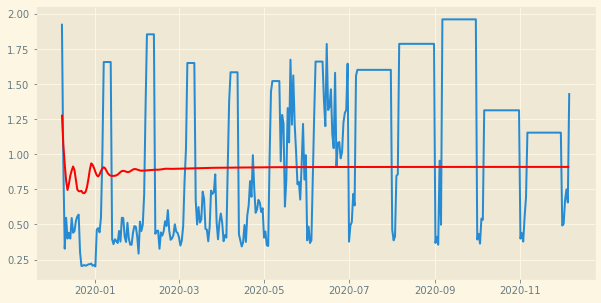

In [76]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from matplotlib import pyplot

error_AR_RMSE_test = np.sqrt(mean_squared_error(test, predictions))
print('AR Test RMSE: %.3f' % error_AR_RMSE_test)

error_AR_MAE_test = mean_absolute_error(test, predictions)
print('AR Test MAE: %.3f' % error_AR_MAE_test)
# plot results

pyplot.plot(test)
pyplot.plot(predictions, color='red')
rcParams['figure.figsize']  =  22, 10
pyplot.show()

AR Train RMSE: 0.350
AR Train MAE:  0.23934254368617436


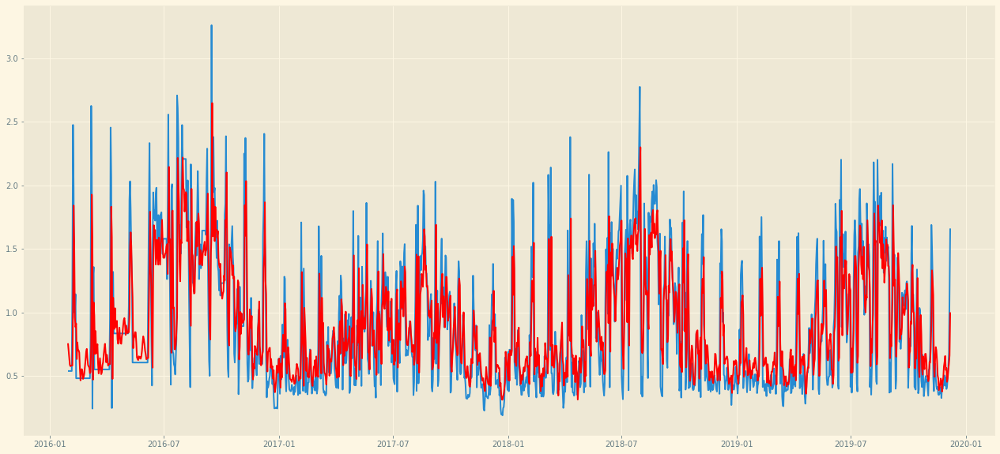

In [77]:
error_AR_RMSE_train = np.sqrt(mean_squared_error(train[23:], model_fit.fittedvalues))
print('AR Train RMSE: %.3f' % error_AR_RMSE_train)

error_AR_MAE_train = mean_absolute_error(train[23:], model_fit.fittedvalues)
print('AR Train MAE: ', error_AR_MAE_train)
# plot results

pyplot.plot(train[23:])
pyplot.plot(model_fit.fittedvalues, color='red')
rcParams['figure.figsize']  =  22, 10
pyplot.show()

### 8.2.1. ARMA Model 

In [78]:
from statsmodels.tsa.arima_model import ARMA
model = ARMA(train,order=(6,2))
model_fit = model.fit()
print('Lag: %s' % model_fit.k_ar)
print('Coefficients: %s' % model_fit.params)

Lag: 6
Coefficients: const          0.898783
ar.L1.Value    1.233858
ar.L2.Value   -0.047274
ar.L3.Value   -0.187004
ar.L4.Value   -0.036318
ar.L5.Value   -0.036813
ar.L6.Value    0.066243
ma.L1.Value   -0.568715
ma.L2.Value   -0.345985
dtype: float64


<a id = Section8></a>
### **8.2.2. ARMA Model Performance and Predictor System**

In [79]:
# make predictions
predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
for i in range(len(predictions)):
    print(i,'predicted=%f, expected=%f' % (predictions[i], test.iloc[i]))

0 predicted=1.304180, expected=1.932583
1 predicted=1.073070, expected=0.932333
2 predicted=0.927132, expected=0.327208
3 predicted=0.796786, expected=0.547875
4 predicted=0.716452, expected=0.399500
5 predicted=0.702607, expected=0.441208
6 predicted=0.703832, expected=0.399417
7 predicted=0.715818, expected=0.546125
8 predicted=0.731187, expected=0.441000
9 predicted=0.744179, expected=0.452417
10 predicted=0.752385, expected=0.524125
11 predicted=0.757625, expected=0.557125
12 predicted=0.760355, expected=0.570375
13 predicted=0.761697, expected=0.302083
14 predicted=0.762485, expected=0.203125
15 predicted=0.763252, expected=0.206250
16 predicted=0.764162, expected=0.210625
17 predicted=0.765299, expected=0.205667
18 predicted=0.766619, expected=0.209667
19 predicted=0.768055, expected=0.215542
20 predicted=0.769542, expected=0.216667
21 predicted=0.771039, expected=0.221208
22 predicted=0.772518, expected=0.206125
23 predicted=0.773968, expected=0.210083
24 predicted=0.775387, exp

<a id = Section8></a>
### **8.2.3. ARMA Model Evaluation**

Test RMSE ARMA: 0.582
Test MAE ARMA:  0.5091523967377954


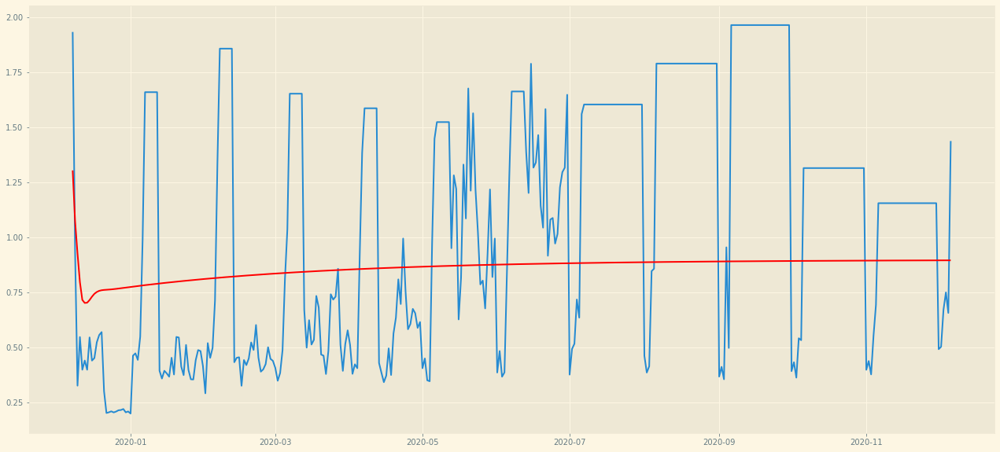

In [80]:
error_ARMA_RMSE_test = np.sqrt(mean_squared_error(test, predictions))
print('Test RMSE ARMA: %.3f' % error_ARMA_RMSE_test)

error_ARMA_MSE_test = mean_absolute_error(test, predictions)
print('Test MAE ARMA: ', error_ARMA_MSE_test)

# plot results
pyplot.plot(test)
pyplot.plot(predictions, color='red')
rcParams['figure.figsize']  =  22, 10
pyplot.show()

Train RMSE ARMA: 0.352
Train MAE ARMA: 0.241


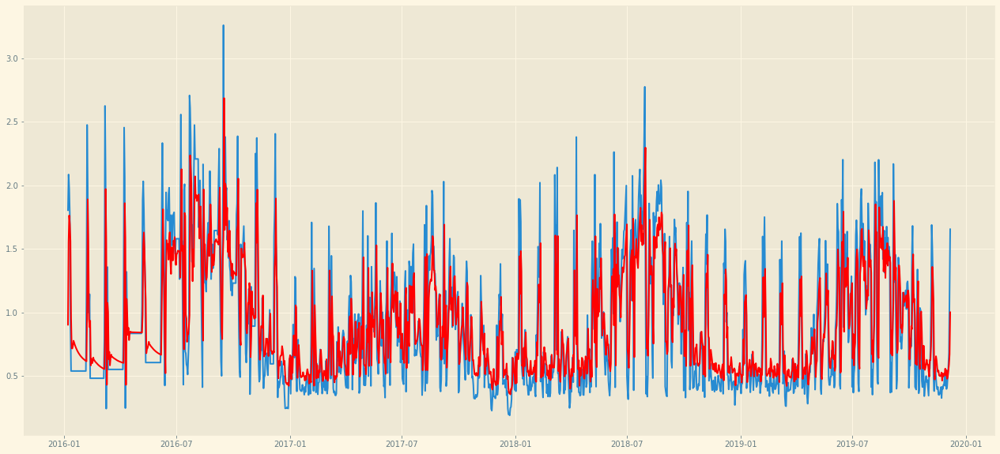

In [81]:
error_ARMA_RMSE_train = np.sqrt(mean_squared_error(train, model_fit.fittedvalues))
print('Train RMSE ARMA: %.3f' % error_ARMA_RMSE_train)

error_ARMA_MAE_train = mean_absolute_error(train, model_fit.fittedvalues)
print('Train MAE ARMA: %.3f' % error_ARMA_MAE_train)
# plot results

pyplot.plot(train)
pyplot.plot(model_fit.fittedvalues, color='red')
rcParams['figure.figsize']  =  22, 10
pyplot.show()

### 8.3.1. ARIMA Model 

In [82]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(indexedDataset_day, order=(6,0,2))
print('Lag: %s' % model_fit.k_ar)
print('Coefficients: %s' % model_fit.params)

Lag: 6
Coefficients: const          0.898783
ar.L1.Value    1.233858
ar.L2.Value   -0.047274
ar.L3.Value   -0.187004
ar.L4.Value   -0.036318
ar.L5.Value   -0.036813
ar.L6.Value    0.066243
ma.L1.Value   -0.568715
ma.L2.Value   -0.345985
dtype: float64


<a id = Section8></a>
### **8.3.2. ARIMA Model Performance and Predictor System**

In [83]:
results_ARIMA = model.fit()
results_ARIMA.fittedvalues.shape

(1797,)

<a id = Section8></a>
### **8.3.3. ARIMA Model Evaluation**

Test RMSE ARIMA: 0.340
Test MAE ARIMA:  0.22958379111309188


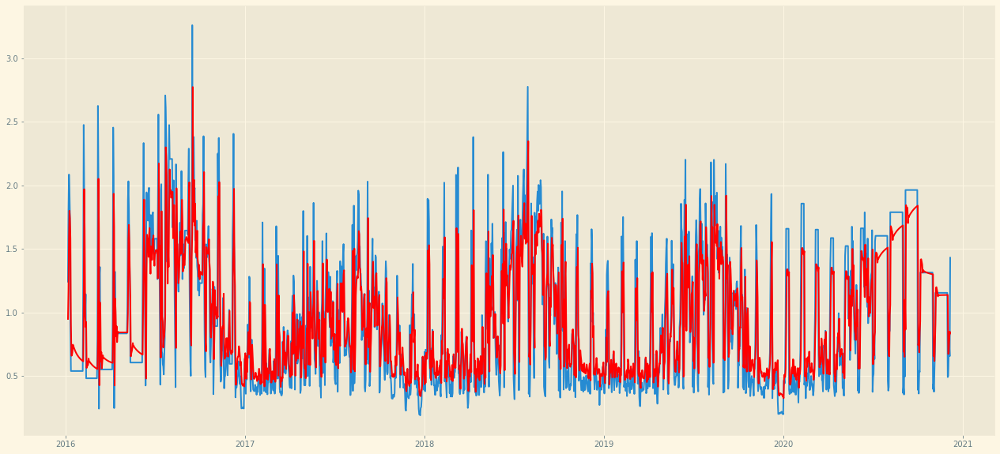

In [84]:
error_ARIMA_RMSE_test = np.sqrt(mean_squared_error(indexedDataset_day, results_ARIMA.fittedvalues))
print('Test RMSE ARIMA: %.3f' % error_ARIMA_RMSE_test)

error_ARIMA_MAE_test = mean_absolute_error(indexedDataset_day, results_ARIMA.fittedvalues)
print('Test MAE ARIMA: ', error_ARIMA_MAE_test)

# plot results
pyplot.plot(indexedDataset_day)
pyplot.plot(results_ARIMA.fittedvalues, color='red')
rcParams['figure.figsize']  =  22, 10
pyplot.show()

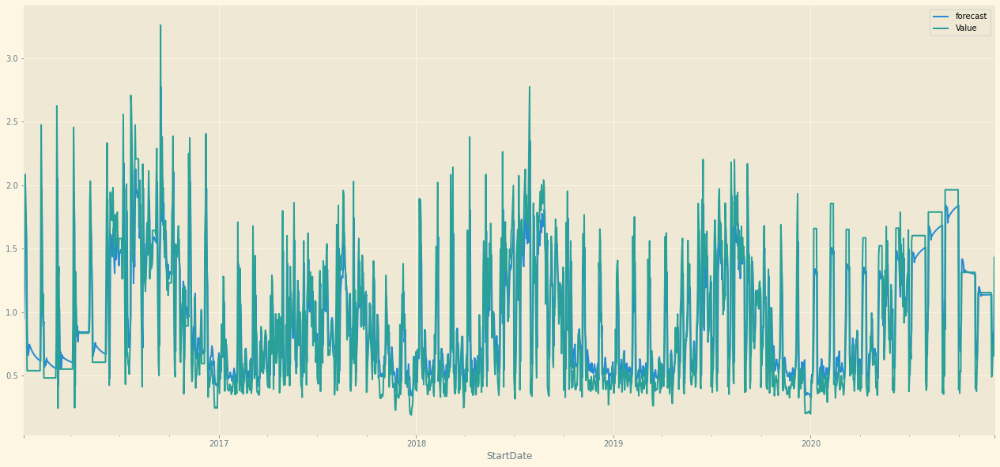

In [376]:
fitted_values = results_ARIMA.plot_predict()

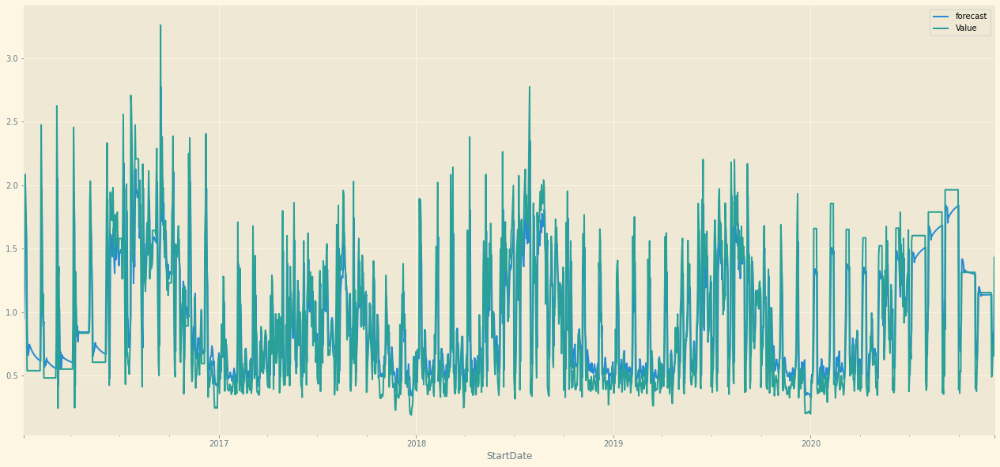

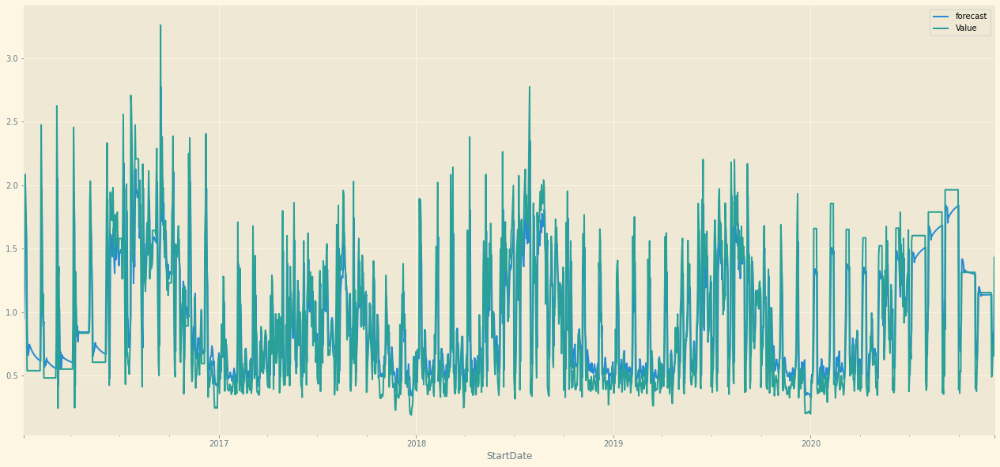

In [377]:
rcParams['figure.figsize']  =  22, 10
results_ARIMA.plot_predict()

<a id = Section9></a>
### **9. Future Prediction**

In [378]:
three_yr_forecast = results_ARIMA.predict(start=len(indexedDataset_day),end = len(indexedDataset_day) + 1105) 

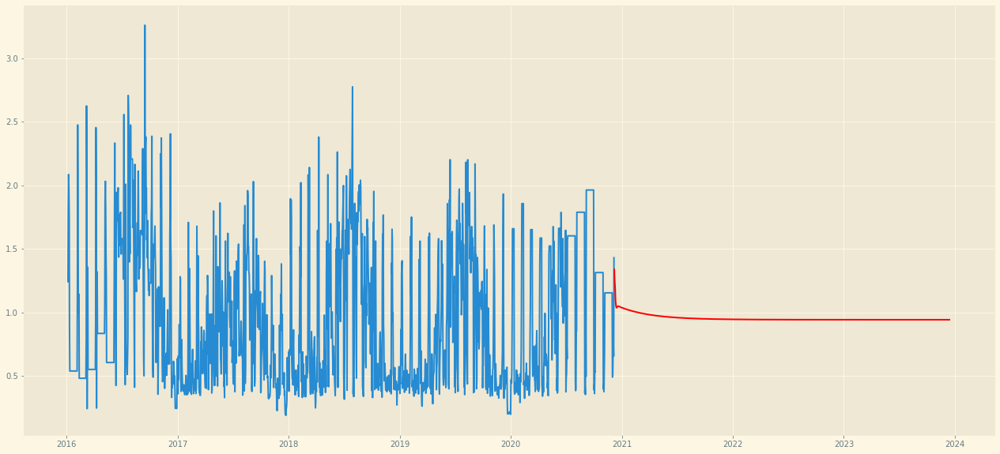

In [379]:
pyplot.plot(indexedDataset_day)
pyplot.plot(three_yr_forecast, color='red')
pyplot.show()

<a id = Section10></a>
### 10. Approach for model building -  Using facebook Prophet

In [42]:
#conda install -c conda-forge/label/cf201901 fbprophet

In [43]:
from fbprophet import Prophet

In [44]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35952 entries, 0 to 35951
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   StartDate    35952 non-null  datetime64[ns]
 1   Value (kWh)  35952 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 561.9 KB


In [45]:
indexedDataset_fb = dataset
indexedDataset_fb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35952 entries, 0 to 35951
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   StartDate    35952 non-null  datetime64[ns]
 1   Value (kWh)  35952 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 561.9 KB


In [46]:
indexedDataset_fb_final = indexedDataset_fb.reset_index()[['StartDate', 'Value (kWh)']].rename({'StartDate' : 'ds', 'Value (kWh)' : 'y'}, axis='columns')


In [47]:
indexedDataset_fb_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35952 entries, 0 to 35951
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      35952 non-null  datetime64[ns]
 1   y       35952 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 561.9 KB


In [48]:
indexedDataset_fb_final

,ds,y
0,2016-01-06 00:00:00,1.057
1,2016-01-06 01:00:00,1.171
2,2016-01-06 02:00:00,0.560
3,2016-01-06 03:00:00,0.828
4,2016-01-06 04:00:00,0.932
...,...,...
35947,2020-07-07 19:00:00,1.307
35948,2020-07-07 20:00:00,2.872
35949,2020-07-07 21:00:00,2.138
35950,2020-07-07 22:00:00,2.199


In [49]:
train = indexedDataset_fb_final[(indexedDataset_fb_final['ds'] >= '2016-01-06') & (indexedDataset_fb_final['ds'] <= '2019-12-31')]
test = indexedDataset_fb_final[(indexedDataset_fb_final['ds'] > '2019-12-31')]

In [50]:
print(train.shape)
test.shape

(31393, 2)


(4559, 2)

In [51]:
m = Prophet(interval_width=0.95, yearly_seasonality=True)
m.fit(train)

In [52]:
m.params

{'k': array([[-0.64341353]]),
 'm': array([[0.26915487]]),
 'delta': array([[ 2.85923399e-01,  1.58222075e-01, -9.69945321e-02,
         -1.10268942e-01,  1.36398967e-05,  1.06166317e-03,
          1.29448933e-07, -9.61238345e-03,  3.68190925e-07,
          5.85008628e-01,  2.48088773e-01,  9.87932890e-07,
          1.22095185e-06, -3.40632362e-01, -7.32205049e-03,
          4.72924763e-07, -1.61691675e-07, -1.28736812e-01,
         -6.35453323e-02,  3.85898603e-07,  6.14262985e-02,
          1.38651556e-06, -4.28911730e-08,  9.24755826e-08,
         -5.28784400e-07]]),
 'sigma_obs': array([[0.11870686]]),
 'beta': array([[-2.69017426e-02, -5.25855487e-02,  1.42067450e-02,
          2.80460212e-03,  2.13316578e-03,  2.81891750e-03,
         -3.09321089e-03, -2.36213462e-03, -7.17019425e-04,
         -1.54968446e-03, -5.87819618e-04, -1.29733162e-03,
          5.03656089e-03, -3.18058921e-03, -3.00720165e-03,
          1.37825065e-03,  3.40843878e-03, -2.11240278e-03,
          3.701702

In [53]:
future = m.make_future_dataframe(periods=1461)
future.tail

<bound method NDFrame.tail of                        ds
0     2016-01-06 00:00:00
1     2016-01-06 01:00:00
2     2016-01-06 02:00:00
3     2016-01-06 03:00:00
4     2016-01-06 04:00:00
...                   ...
32849 2023-12-27 00:00:00
32850 2023-12-28 00:00:00
32851 2023-12-29 00:00:00
32852 2023-12-30 00:00:00
32853 2023-12-31 00:00:00

[32854 rows x 1 columns]>

In [54]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
32849,2023-12-27,-0.012534,-4.892270,4.701796
32850,2023-12-28,0.010630,-4.633271,4.699154
32851,2023-12-29,0.009585,-4.515108,4.636744
32852,2023-12-30,0.008622,-4.643271,4.538461
32853,2023-12-31,0.065061,-4.338644,4.956182


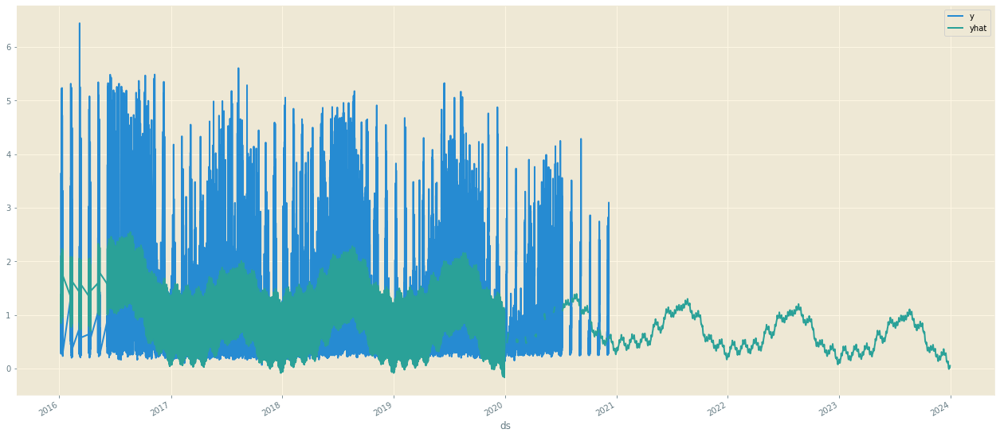

In [55]:
pd.concat([indexedDataset_fb_final.set_index('ds')['y'], forecast.set_index('ds')['yhat']],axis=1).plot();

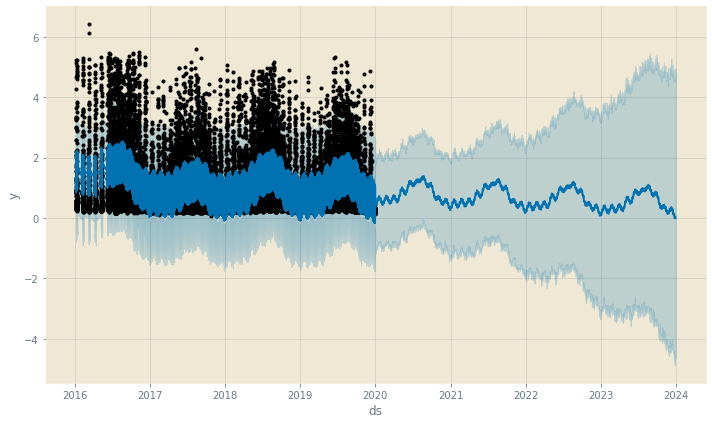

In [56]:
fig1 = m.plot(forecast)

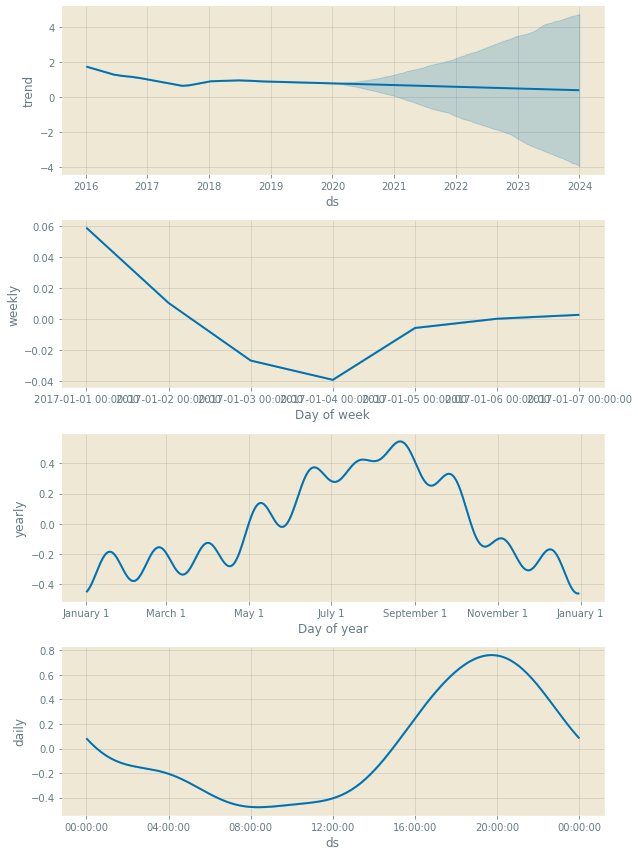

In [57]:
fig2 = m.plot_components(forecast)

In [58]:
fig = plot_plotly(m, forecast)
py.iplot(fig)

In [88]:
from fbprophet.diagnostics import cross_validation
cv_results = cross_validation(model = m, initial= '731 days', horizon='365 days')
cv_results.head()

INFO:fbprophet:Making 2 forecasts with cutoffs between 2018-07-01 12:00:00 and 2018-12-31 00:00:00


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2018-07-01 13:00:00,0.946998,-0.625898,2.504956,0.687,2018-07-01 12:00:00
1,2018-07-01 14:00:00,1.074312,-0.394739,2.702321,0.465,2018-07-01 12:00:00
2,2018-07-01 15:00:00,1.307001,-0.212993,2.849275,0.368,2018-07-01 12:00:00
3,2018-07-01 16:00:00,1.603699,-0.014619,3.202310,0.282,2018-07-01 12:00:00
4,2018-07-01 17:00:00,1.889268,0.333321,3.374798,0.306,2018-07-01 12:00:00


In [89]:
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(cv_results)
df_p

,horizon,mse,rmse,mae,mape,coverage
0,36 days 12:00:00,0.725498,0.851762,0.636910,0.977588,0.917808
1,36 days 13:00:00,0.726055,0.852089,0.637421,0.978131,0.917808
2,36 days 14:00:00,0.725995,0.852054,0.637342,0.977709,0.917808
3,36 days 15:00:00,0.725489,0.851756,0.636822,0.976071,0.917808
4,36 days 16:00:00,0.724479,0.851163,0.636114,0.973220,0.917808
...,...,...,...,...,...,...
7880,364 days 20:00:00,0.779165,0.882703,0.724070,1.595531,0.948059
7881,364 days 21:00:00,0.776945,0.881445,0.723035,1.591649,0.948630
7882,364 days 22:00:00,0.776374,0.881121,0.722584,1.591060,0.948630
7883,364 days 23:00:00,0.775653,0.880712,0.722030,1.589929,0.948630


<a id = Section11></a>
### **11. Conclusions & Future Development**

Many people have tried to predict power consumption. However it is a difficult task. The objective of this exercise was to provide an estimation of the power consumption and consequently estimating the probable electricity bill. I believe this tool can help in this objective.

At the outset when dataset is decomposed, we observe that there is trend component and yearly seasonal component. We also see that there were some missing values which has been handled by forward fill method. We see that different models provide different outputs - in fact the models (AR, ARMA, ARIMA) provides divergent results as compared to FB Prophet. The output from FB Prophet - it depicts an uniform yearly electricity consumption pattern i.e. there is almost no to slight variation.

The way forward would be to look at the consumption for a larger building or community and also to have a model which predicts for longer period of time say - 10 years historical data. It may also help electricity producer to have an estimation of power reserve.

This would need to be implemented in the real world to see what sort of value it can provide. I look forward to spending more time on this project to improve the analytic and build a system to not only predict the estimated monthly bill of a consumer but also help the producer to have enough reserve so that it does not run out of stock.